In [1]:
import numpy as np
import dapy.filters as filters
import dapy.utils.pou as pou
import dapy.utils.localisation as localisation
import dapy.ot as ot
from dapy.models import SpatialStochasticTurbulenceModel, FourierStochasticTurbulenceModel
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline
plt.style.use('seaborn-white')
plt.rcParams['figure.dpi'] = 100

## Model

This model is a linear-Gaussian stochastic test model for turbulent signals due to Majda and Harlim [1].

The governing stochastic partial differential equation (SPDE) is

$$\mathrm{d}X(s, \tau) = (\alpha \partial^2_0 X(s, \tau) + \beta \partial_0 X(s, \tau) - \gamma X(s, \tau)) \mathrm{d}\tau + \kappa(s) \circledast \mathrm{d}W(s, \tau)$$

where $s$ is the spatial coordinate in a periodic one-dimensional domain $[0, S)$, $\tau$ the time
coordinate, $X(s, \tau)$ the state field process, $\alpha$ is a coefficient controlling the degree of diffusion in the dynamics, $\beta$ a coefficient controlling the degree of linear advection in the dynamics, $\gamma$ a coefficient controlling the
degree of damping in the dynamics, $W(s, \tau)$ a space-time white noise process,
$\kappa(s)$ a spatial smoothing kernel and $\circledast$ indicates circular convolution in the
spatial coordinate.

Using a spectral collocation based spatial discretisation on a mesh of $M$ equispaced nodes such that 

$$X(s, \tau) = \sum_{k=-K}^K \tilde{X}_k(\tau) \exp(i\omega_k s), \quad \tilde{X}_{-k}(\tau) = \tilde{X}_{k}(\tau)^* ~\forall k \in 1{:}K, \quad \omega_k = 2 \pi k / S ~\forall k \in -K{:}K, \quad K = \lfloor M / 2 \rfloor$$

this corresponds to a linear system of stochastic differential equations (SDEs) in the complex Fourier coefficients $\tilde{X}_{0:K}$

$$
  \DeclareMathOperator{\DFT}{\mathsf{DFT}}
  \mathrm{d}\tilde{X}_k(\tau) = (-\alpha\omega_k^2 - \gamma + i \beta \omega_k) \tilde{X}_k(\tau) + \tilde{\kappa}_k \mathrm{d}\tilde{W}_k(\tau) \quad \forall k \in \{ 0, \dots, K \}
$$

where $\tilde{W}_{0:K}(\tau)$ are complex-valued Wiener processes and $\tilde{\kappa}_{0:K}$ are the Fourier coefficients of
the smoothing kernel $\kappa(s)$. 

This time-homogenous linear system of SDES in the Fourier coefficients can be solved exactly, giving a complex normal transition probability

$$\tilde{X}_k(\tau) \,|\, \tilde{X}_k(0) \sim \textsf{ComplexNormal}\left(\exp((-\psi_k + i \beta\omega_k) \tau) \tilde{X}_k(0), (1 - \exp(-2 \psi_k \tau)) \frac{\tilde{\kappa}_k^2}{2\psi_k}\right)$$

where $\psi_k = \alpha \omega_k^2 + \gamma$. The stationary distribution of the SDEs can also be solved for as

$$ \tilde{X}_k(\infty) \sim \textsf{ComplexNormal}\left(0, \frac{\tilde{\kappa}_k}{2\psi_k}\right).$$

The smoothing kernel Fourier coefficients are assumed to be

$$\tilde{\kappa}_k = \sigma \exp(-\omega_k^2 \ell^2) \sqrt{M / S} $$

where $\sigma$ is a parameter controlling the amplitude and $\ell$ a parameter controlling
the length scale.

Here we use $S = 1$, $M=512$, $\Delta = 0.25$, $\ell = 4 \times 10^{-3}$, $\sigma = 0.1$ and $\alpha = 4\times 10^{-5}$, $\beta = 0.1$ and $\gamma = 0.1$.

The state is noisily observed every time step at 64 equispaced spatial mesh nodes with independent additive Gaussian noise of standard deviation 0.5 at each observation point.

### References

  1. Majda, A. J., & Harlim, J. (2012). Filtering complex turbulent systems. Cambridge University Press.

In [2]:
model_params = {
    'dim_state': 512,
    'observation_space_indices': slice(4, None, 8),
    'time_step': 0.25,
    'domain_extent': 1.0,
    'diffusion_coeff': 4e-5,
    'advection_coeff': 0.1,
    'damping_coeff': 0.1,
    'observation_noise_std': 0.5,
    'state_noise_amplitude': 0.1,
    'state_noise_length_scale': 4e-3,
}
model = SpatialStochasticTurbulenceModel(**model_params)

## Generate data from model

In [3]:
observation_time_indices = np.arange(0, 200)
seed = 20190117
rng = np.random.default_rng(seed)
state_sequence, observation_sequence = model.sample_state_and_observation_sequences(
    rng, observation_time_indices, return_states_at_all_times=True)

Sampling: 100%|██████████|200/200 [00:00<00:00, 1375.03time-steps/s]

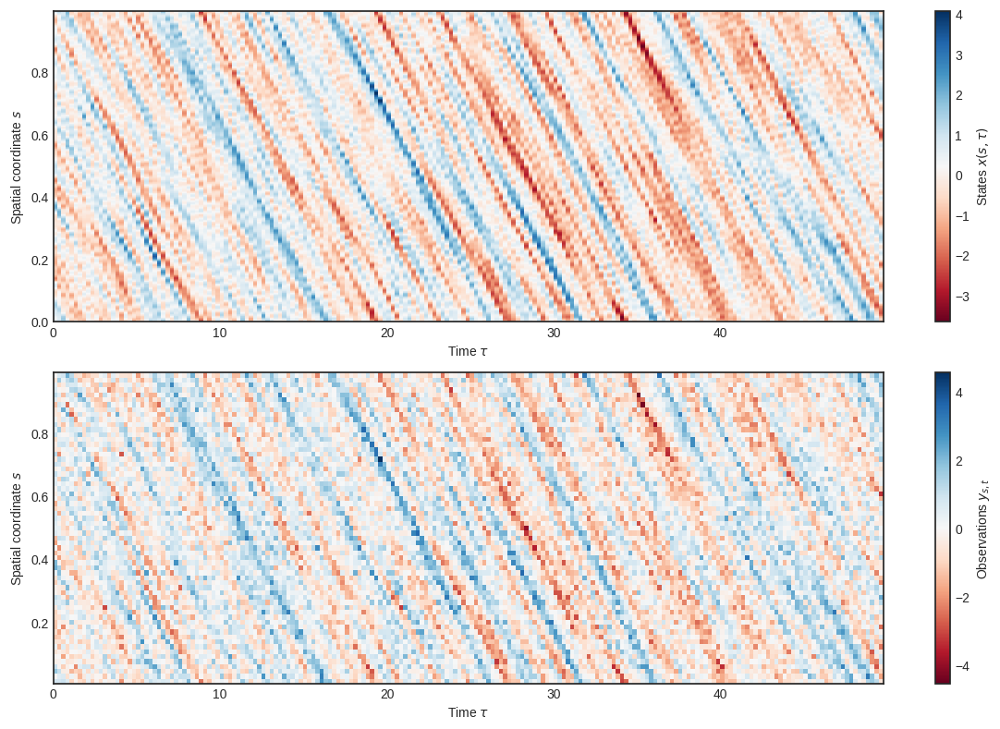

In [4]:
fig, axes = plt.subplots(2, 1, squeeze=True, figsize=(12, 8))
num_time_indices = observation_time_indices.max()
times = np.linspace(0, num_time_indices * model_params['time_step'], num_time_indices + 1)
for ax, sequence, ts, ss, label in zip(
    axes,
    (state_sequence, observation_sequence), 
    (times, times[observation_time_indices]),
    (model.mesh_node_coords[:, 0], model.observation_coords[:, 0]),
    ('States $x(s, \\tau)$', 'Observations $y_{s, t}$')
):
    artist = ax.pcolormesh(ts, ss, sequence.T, cmap='RdBu')
    ax.set_xlabel('Time $\\tau$')
    ax.set_ylabel('Spatial coordinate $s$')
    fig.colorbar(artist, ax=ax, label=label)
fig.tight_layout()

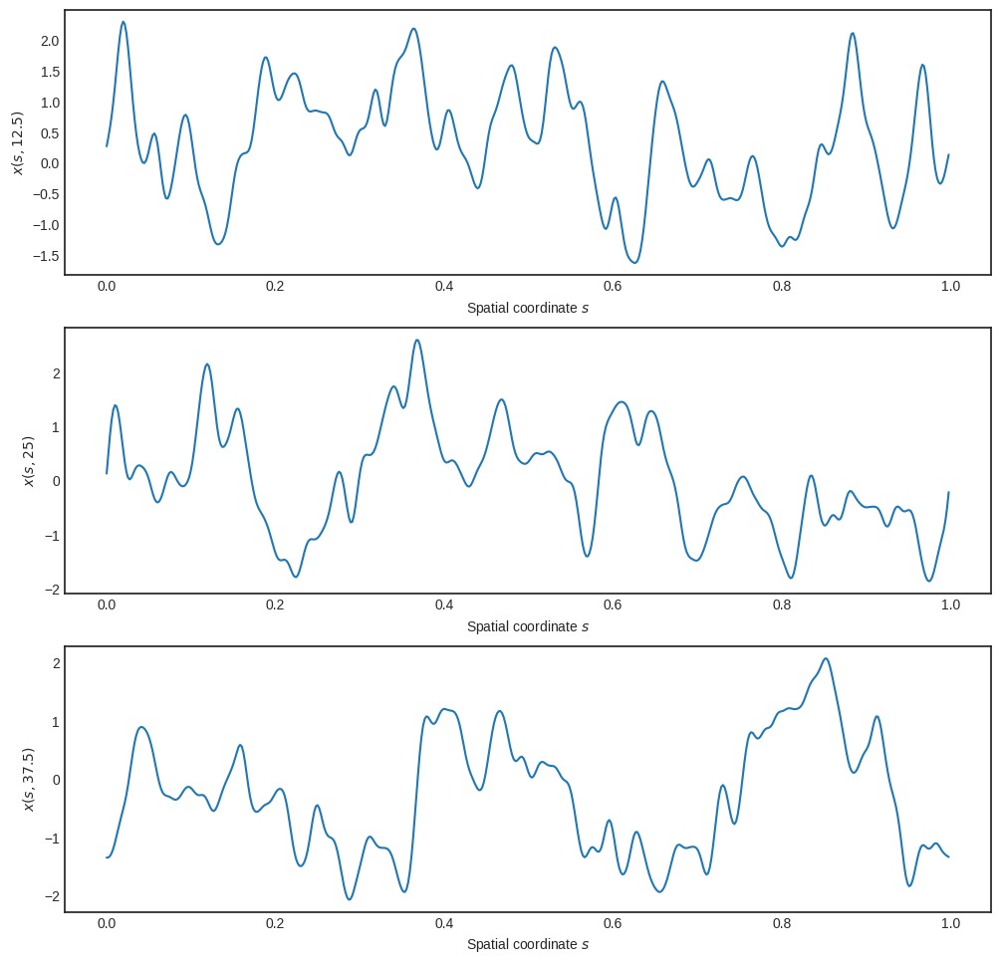

In [5]:
plot_time_indices = [50, 100, 150]
fig, axes = plt.subplots(len(plot_time_indices), 1, figsize=(12, len(plot_time_indices) * 4))
for t, ax in zip(plot_time_indices, axes):
    _ = ax.plot(model.mesh_node_coords[:, 0], state_sequence[t, :])
    ax.set_xlabel('Spatial coordinate $s$')
    ax.set_ylabel(f'$x(s, {times[t]:.3g})$')

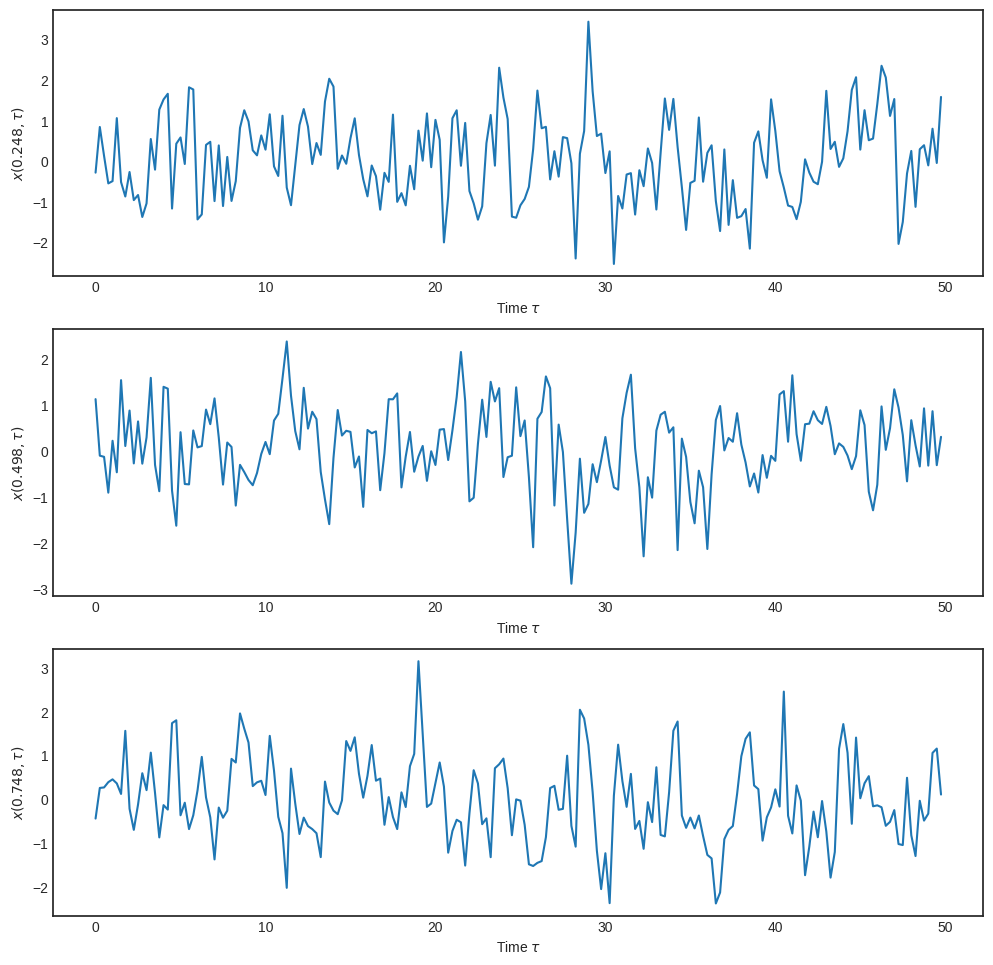

In [6]:
plot_space_indices = [127, 255, 383]
fig, axes = plt.subplots(len(plot_space_indices), 1, 
                         figsize=(12, len(plot_space_indices) * 4))
for s, ax in zip(plot_space_indices, axes):
    _ = ax.plot(times, state_sequence[:, s])
    ax.set_xlabel('Time $\\tau$')
    ax.set_ylabel(f'$x({model.mesh_node_coords[s, 0]:.3g}, \\tau)$')

## Infer state from observations

In [7]:
def plot_results(results, plot_indices, use_space_indices,
                 slice_coordinates, fixed_coordinates, state_sequence,
                 results_are_exact=False, plot_particles=False, plot_region=True, 
                 particle_skip=2, trace_alpha=0.5, truth_label='Truth'):
    fig, axes = plt.subplots(nrows=len(plot_indices), ncols=1, sharex=True, 
                             figsize=(12, len(plot_indices) * 3))
    est_or_exact = 'Exact' if results_are_exact else 'Est.'
    if use_space_indices:
        state_mean_slices = results['state_mean_sequence'][:, plot_indices].T
        state_std_slices = results['state_std_sequence'][:, plot_indices].T
        state_particle_slices = results['state_particles_sequence'][:, ::particle_skip, plot_indices].T
        state_truth_slices = state_sequence[:, plot_indices].T
        labels = [f'$x({fixed_coordinates[i]:.3g}, t)$' for i in plot_indices]
    else:
        state_mean_slices = results['state_mean_sequence'][plot_indices]
        state_std_slices = results['state_std_sequence'][plot_indices]
        state_particle_slices = results['state_particles_sequence'][plot_indices, ::particle_skip]
        state_truth_slices = state_sequence[plot_indices]
        labels = [f'$x(s, {fixed_coordinates[i]:.3g})$' for i in plot_indices]
    for ax, state_mean_slice, state_std_slice, state_particle_slice, state_truth_slice, label in zip(
        axes, state_mean_slices, state_std_slices, state_particle_slices, state_truth_slices, labels
    ):
        ax.plot(slice_coordinates, state_mean_slice, 'g-', lw=1, label=f'{est_or_exact} mean')
        if plot_region:
            ax.fill_between(
                slice_coordinates,
                state_mean_slice - 3 * state_std_slice,
                state_mean_slice + 3 * state_std_slice,
                alpha=0.25, color='g', label=f'{est_or_exact} mean ± 3 standard deviation'
            )
        if plot_particles:
            lines = ax.plot(slice_coordinates, state_particle_slice.T, 'r-', lw=0.25, alpha=trace_alpha)
            lines[0].set_label('Particles')
        ax.set_ylabel(label)
        ax.plot(slice_coordinates, state_truth_slice, 'k--', label=truth_label)
        ax.legend(loc='upper center', ncol=5)
    if use_space_indices:
        ax.set_xlabel('Time $\\tau$')
    else:
        ax.set_xlabel('Spatial coordinate $s$')
    fig.tight_layout()
    return fig, axes

### Exact Kalman filter

In [8]:
kf = filters.FunctionKalmanFilter()

In [9]:
results_kf = kf.filter(
    model, observation_sequence, observation_time_indices, num_sample=100, rng=rng)

Filtering: 100%|██████████|200/200 [00:30<00:00, 6.60time-steps/s]

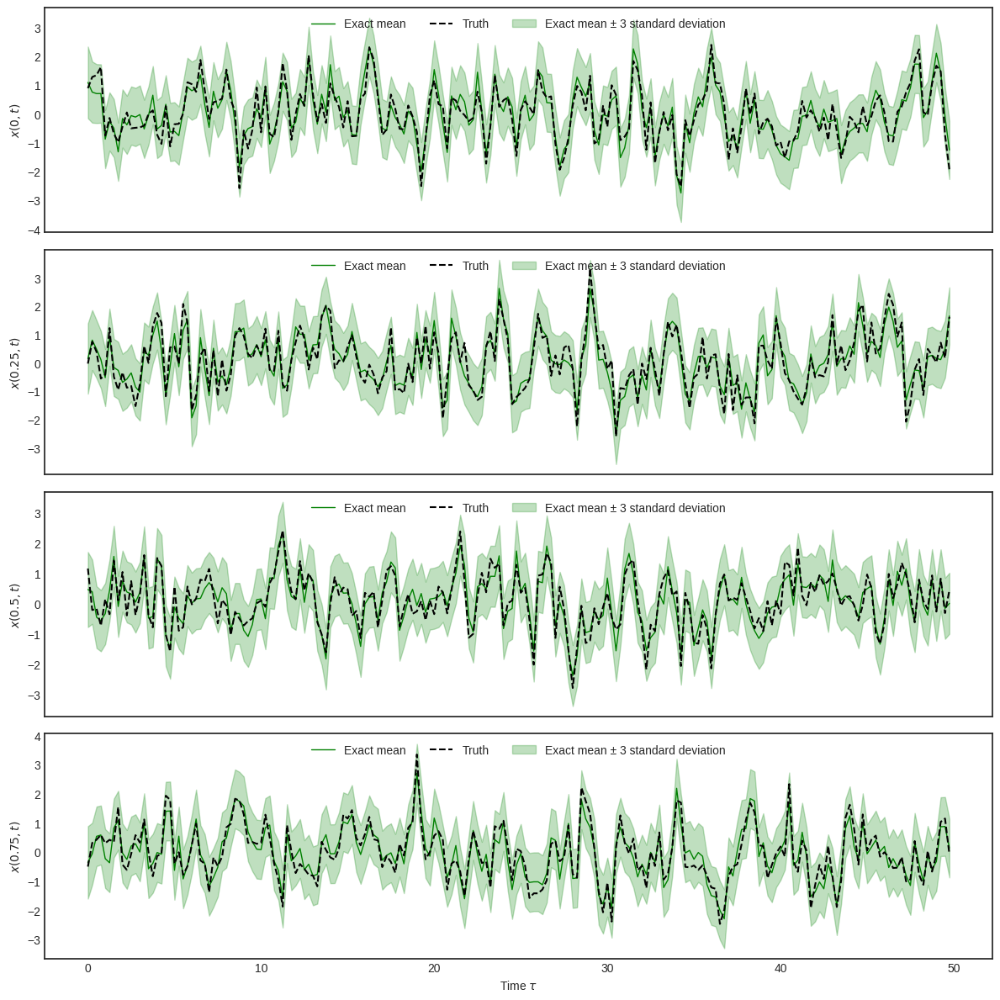

In [10]:
fig, axes = plot_results(
    results_kf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    state_sequence[observation_time_indices], results_are_exact=True)

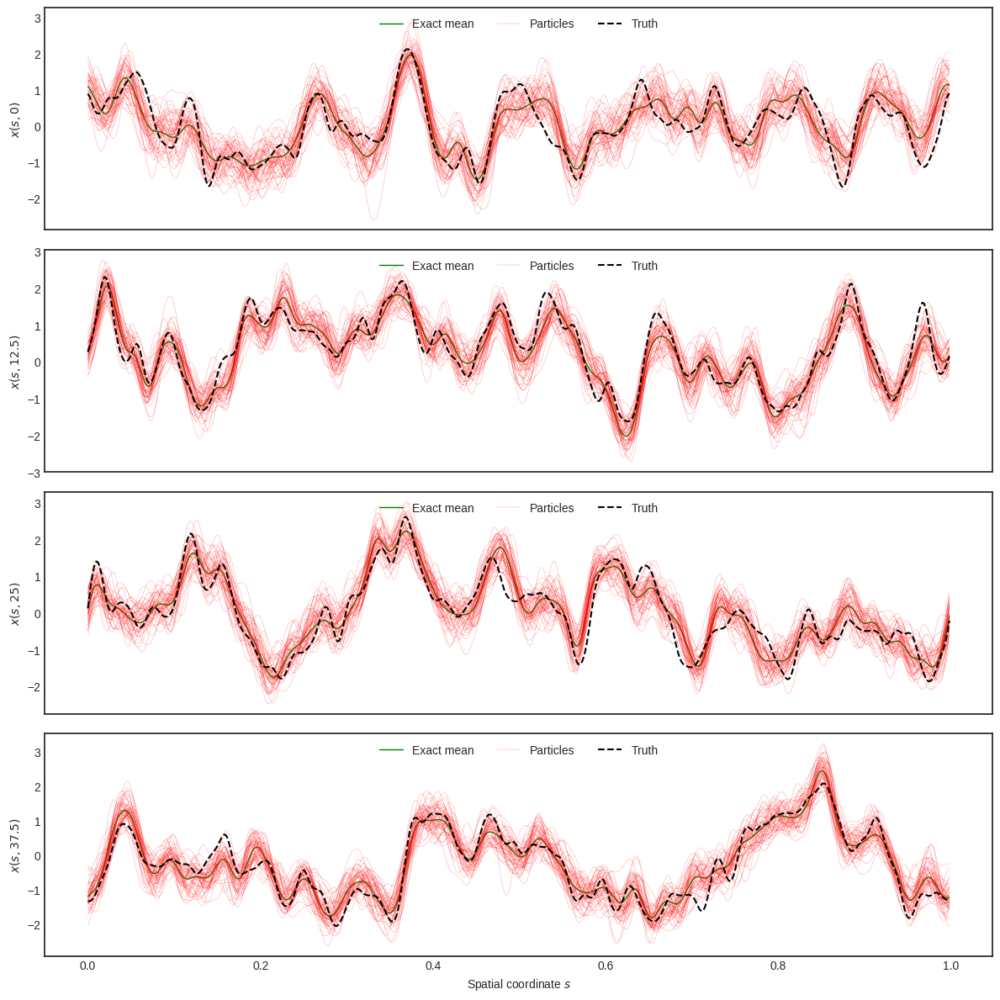

In [11]:
fig, axes = plot_results(
    results_kf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    state_sequence[observation_time_indices], 
    plot_particles=True, results_are_exact=True, plot_region=False)

### Ensemble transform Kalman filter (square root filter)

In [12]:
etkf = filters.EnsembleTransformKalmanFilter()

In [13]:
results_etkf = etkf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [00:01<00:00, 151.76time-steps/s]

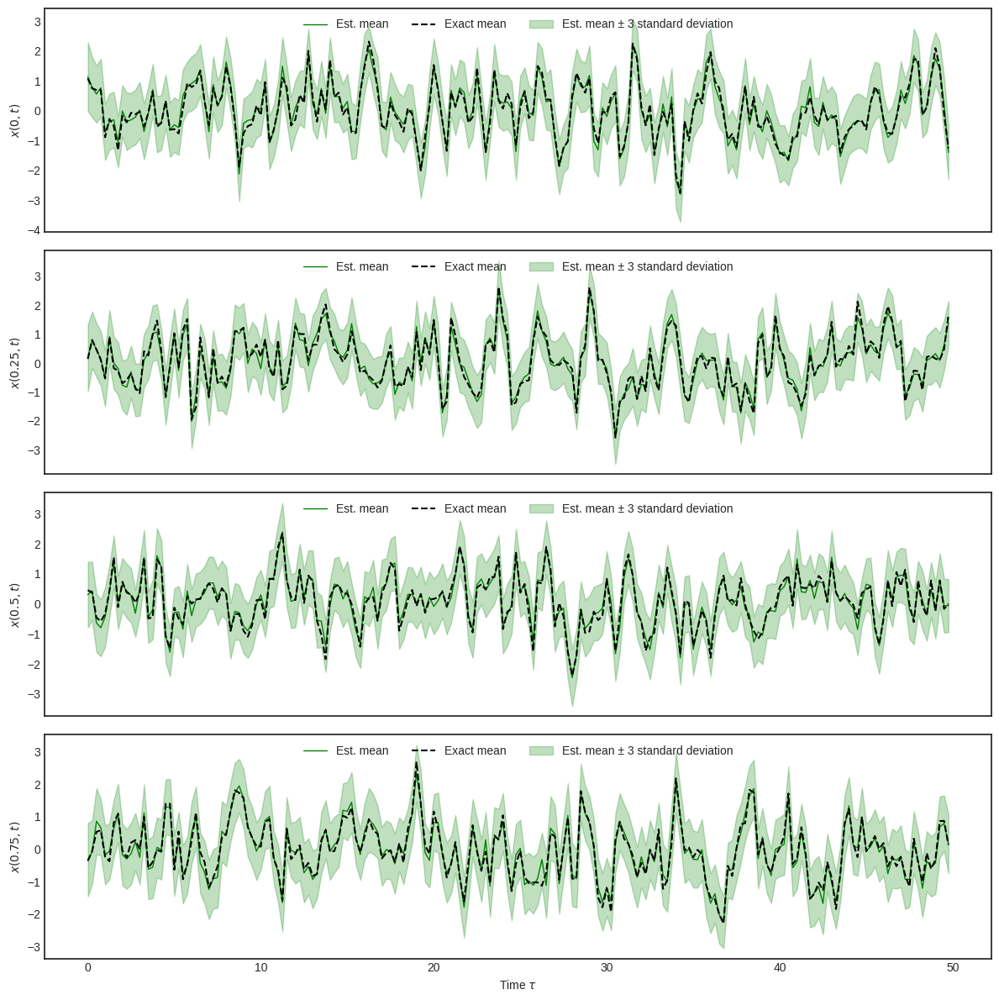

In [14]:
fig, axes = plot_results(
    results_etkf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

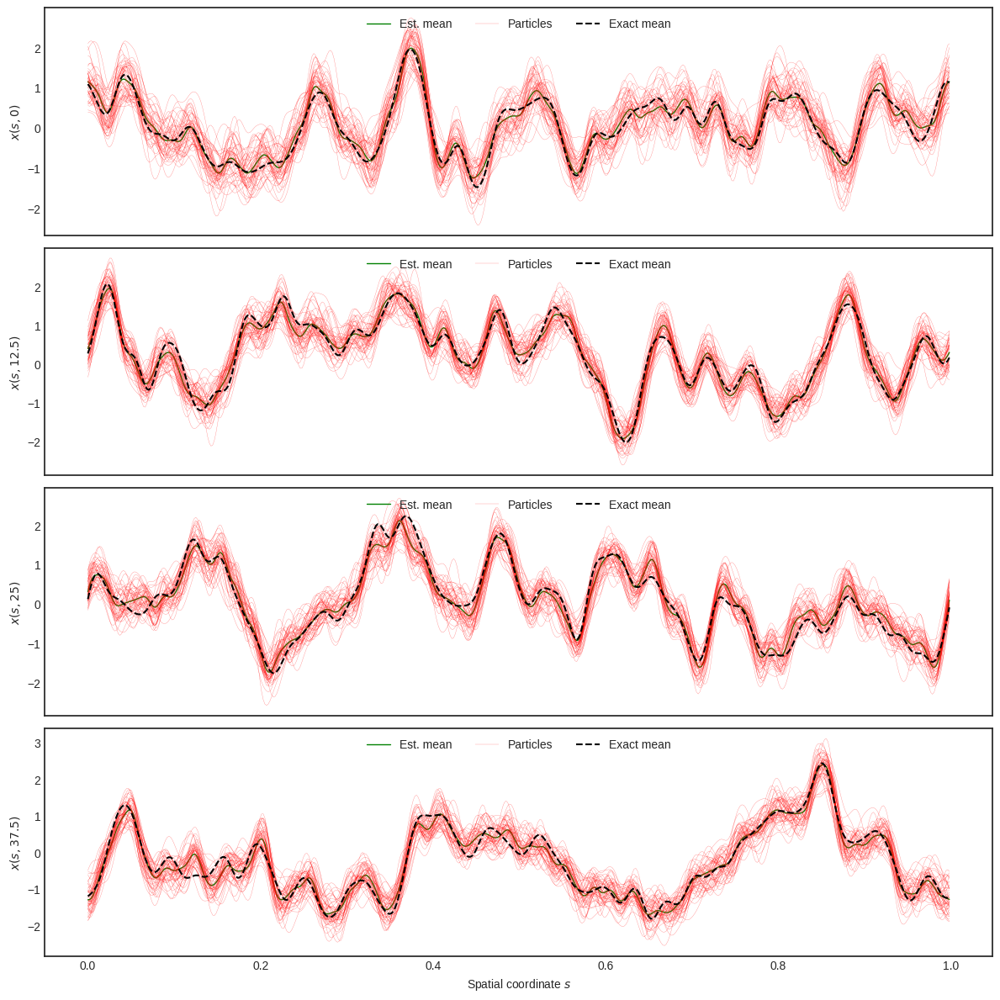

In [15]:
fig, axes = plot_results(
    results_etkf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)

### Local ensemble transform Kalman filter

In [16]:
letkf = filters.LocalEnsembleTransformKalmanFilter(localisation_radius=0.05)

In [17]:
results_letkf = letkf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [00:32<00:00, 6.15time-steps/s]

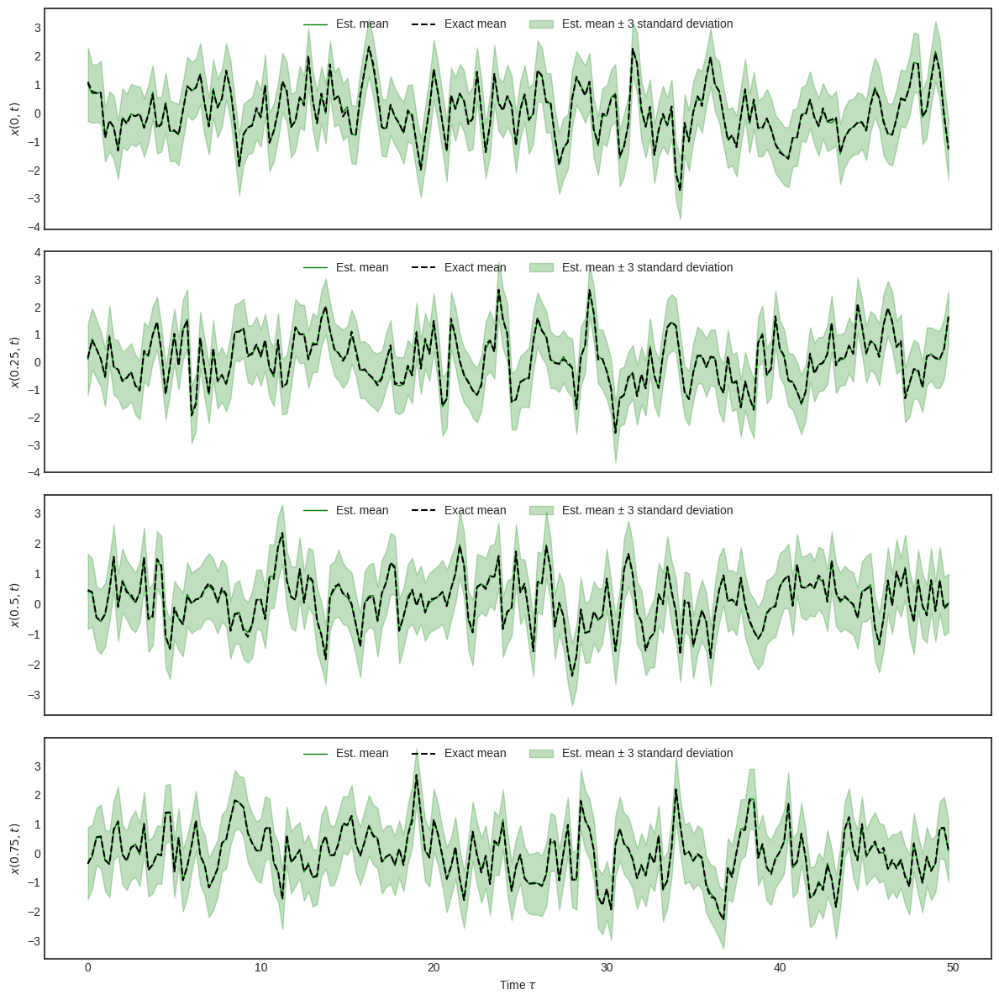

In [18]:
fig, axes = plot_results(
    results_letkf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

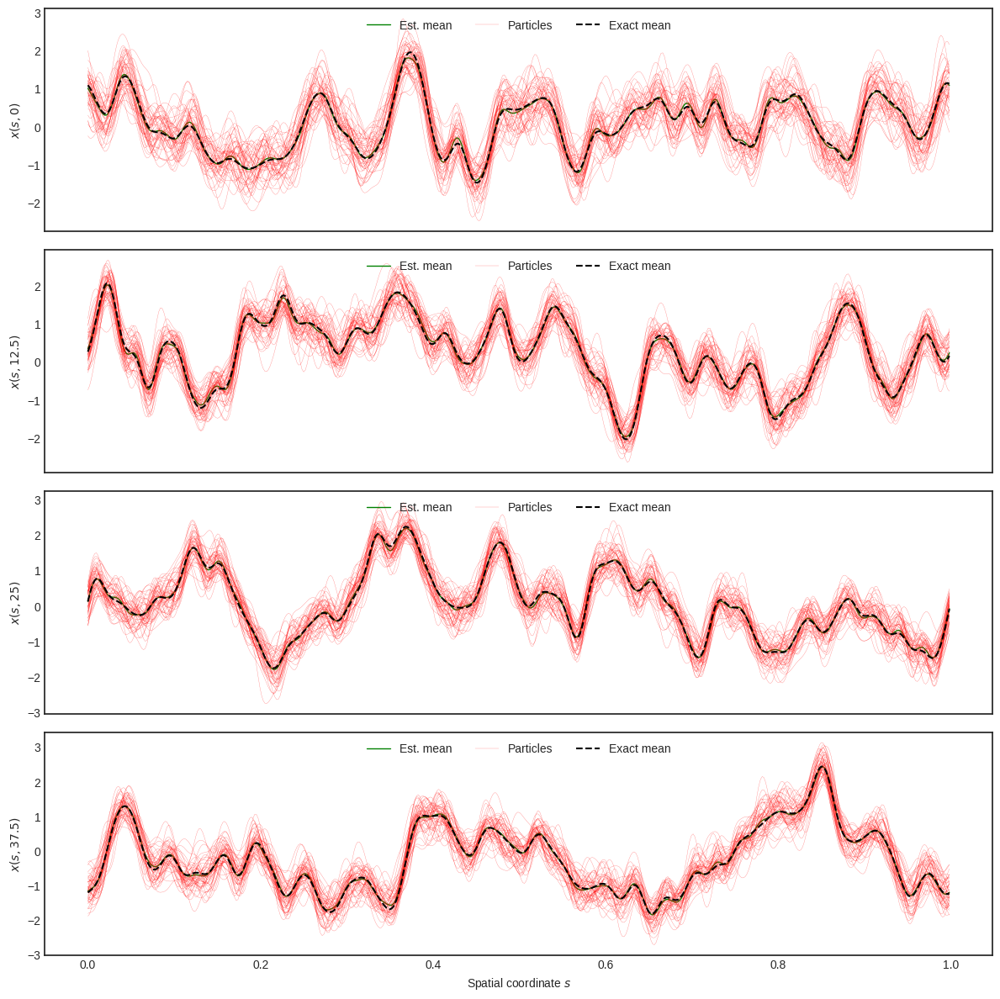

In [19]:
fig, axes = plot_results(
    results_letkf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)

### Bootstrap particle filter

In [20]:
bspf = filters.BootstrapParticleFilter()

In [21]:
results_bspf = bspf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [00:00<00:00, 231.18time-steps/s]

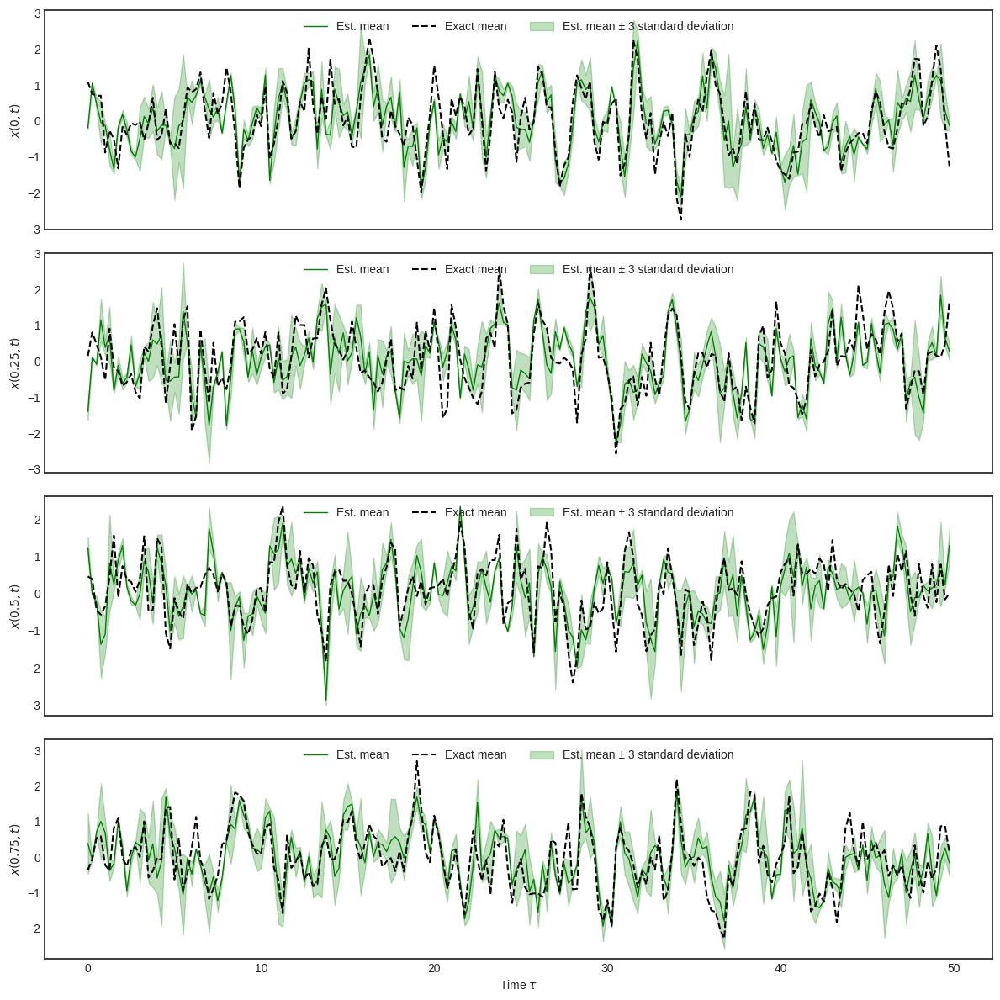

In [22]:
fig, axes = plot_results(
    results_bspf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

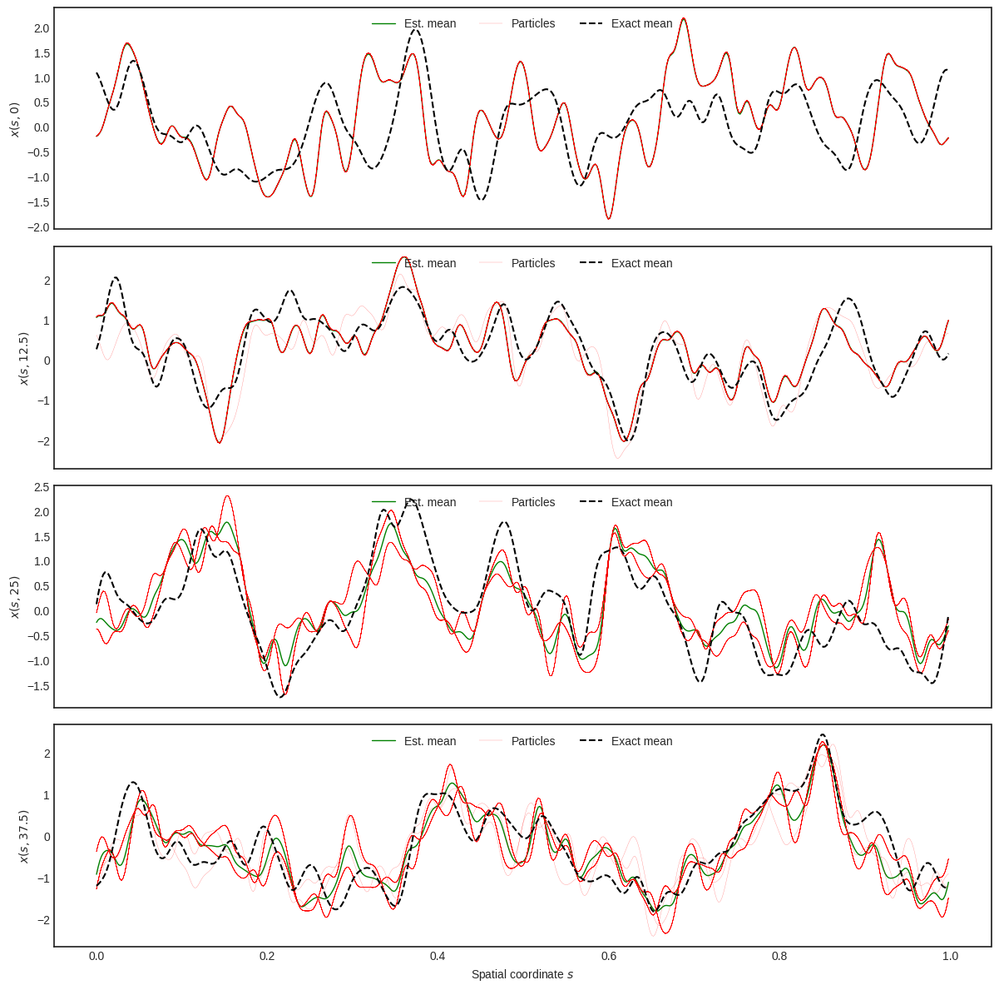

In [23]:
fig, axes = plot_results(
    results_bspf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)

### Ensemble transform particle filter

In [24]:
etpf = filters.EnsembleTransformParticleFilter()

In [25]:
results_etpf = etpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [00:01<00:00, 173.86time-steps/s]

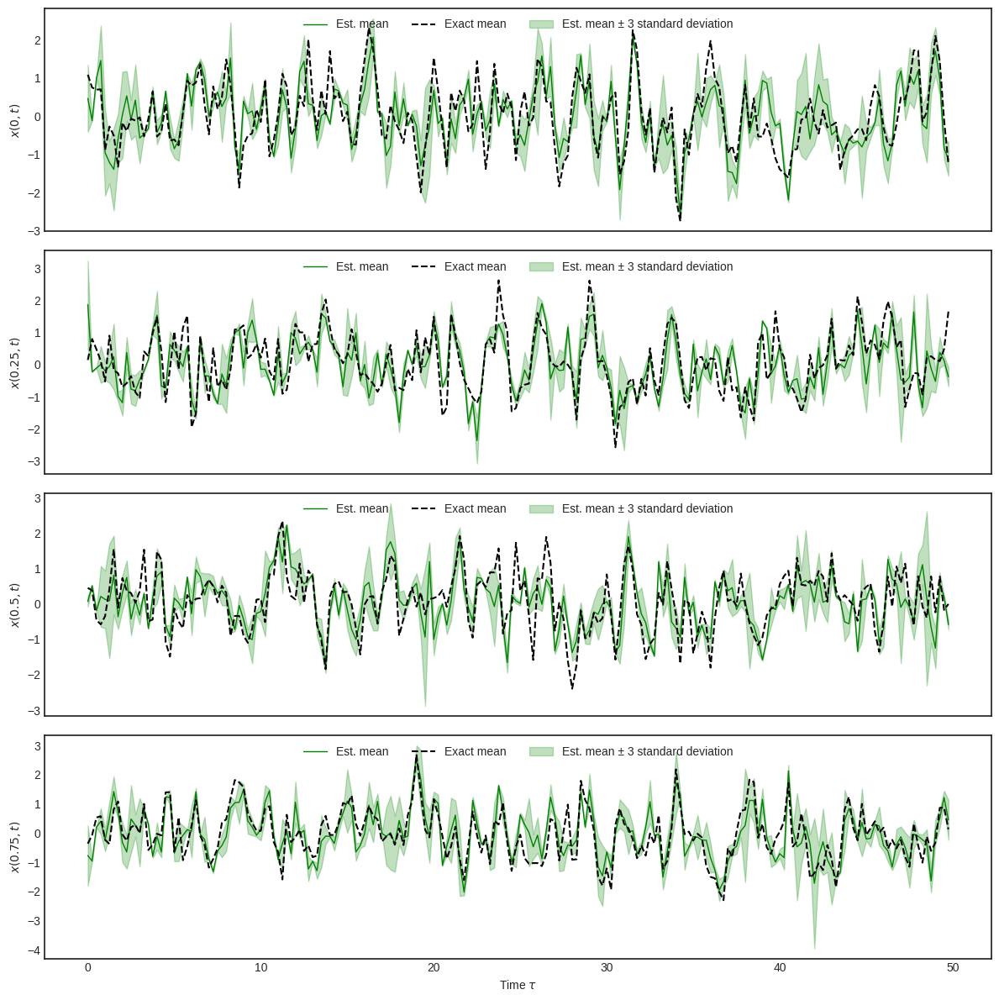

In [26]:
fig, axes = plot_results(
    results_etpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

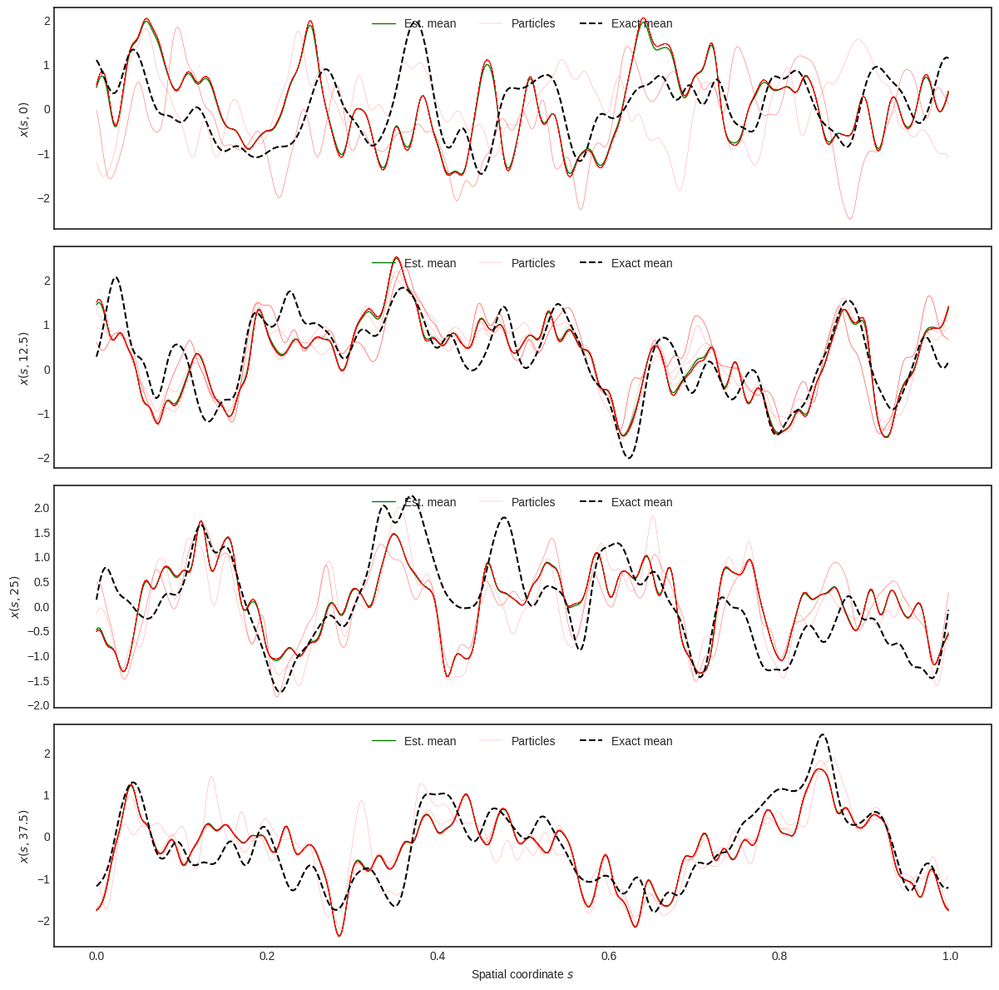

In [27]:
fig, axes = plot_results(
    results_etpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)

### Local ensemble transform particle filter

In [28]:
letpf = filters.LocalEnsembleTransformParticleFilter(localisation_radius=0.05)

In [29]:
results_letpf = letpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [02:16<00:00, 1.46time-steps/s]

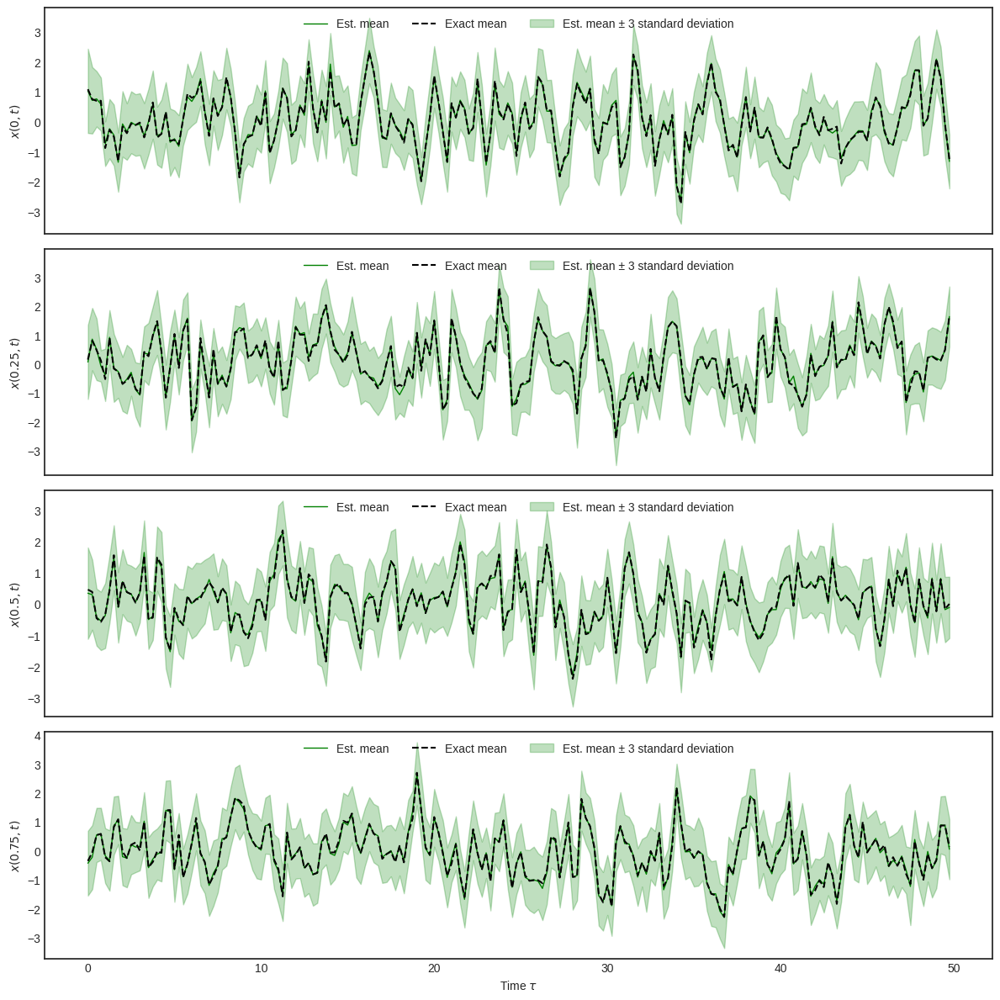

In [30]:
fig, axes = plot_results(
    results_letpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

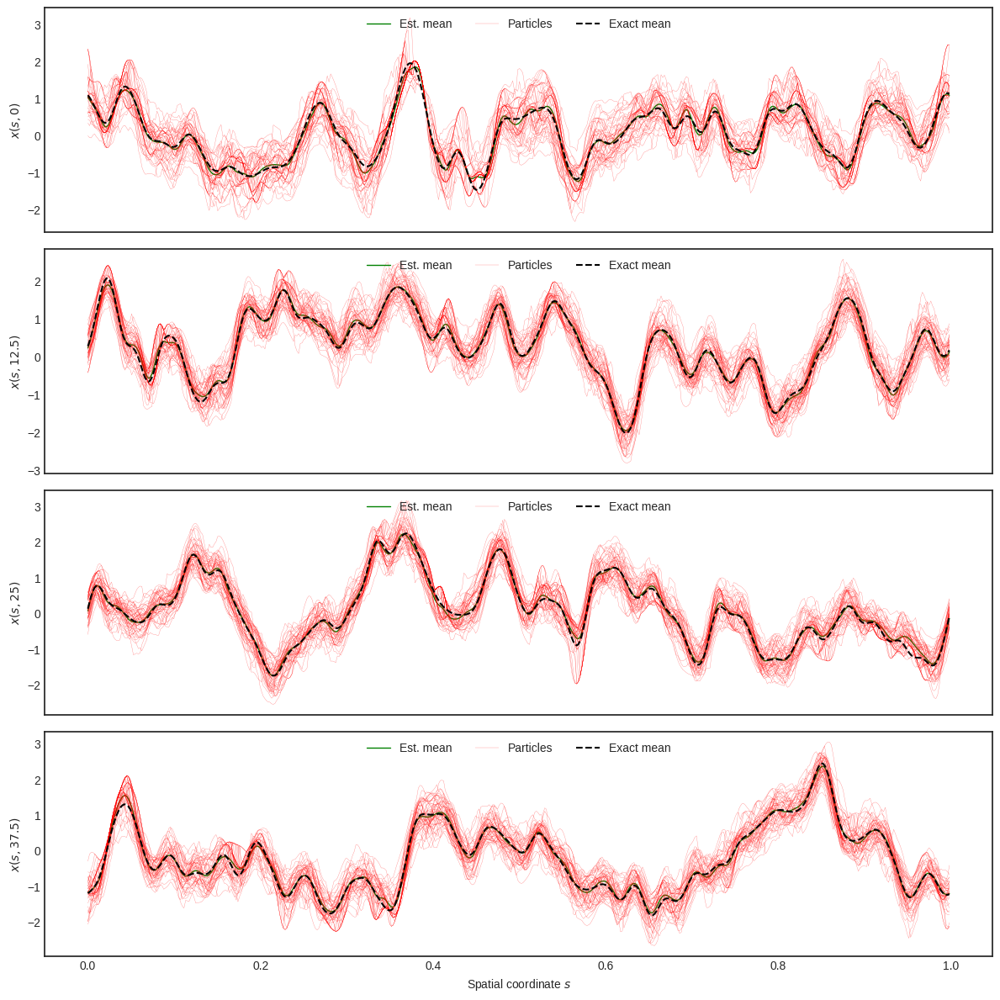

In [31]:
fig, axes = plot_results(
    results_letpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)

### Scalable localised ensemble transform particle filter

In [32]:
partition_of_unity = pou.SmoothedBlock1dPartitionOfUnityBasis(model, 32, kernel_halfwidth=5)

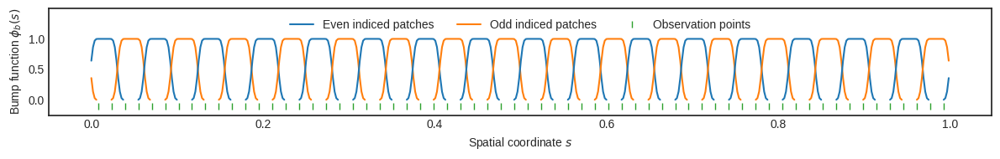

In [33]:
patch_coords = partition_of_unity.split_into_patches(model.mesh_node_coords[:, 0])
patch_bumps = partition_of_unity.split_into_patches_and_scale(np.ones(model.mesh_size))
fig, ax = plt.subplots(figsize=(12, 2))
for p, (bump, coords) in enumerate(zip(patch_bumps, patch_coords)):
    if coords[0] < coords[-1]:
        ax.plot(coords, bump, color=f'C{p%2}')
    else:
        split = np.argmin(coords)
        ax.plot(coords[:split], bump[:split], color=f'C{p%2}')
        ax.plot(coords[split:], bump[split:], color=f'C{p%2}')
ax.plot(model.observation_coords[:, 0], -0.1 * np.ones(model.dim_observation), '|', 
        color='C2')
ax.set_ylabel('Bump function $\\phi_b(s)$')
ax.set_xlabel('Spatial coordinate $s$')
custom_handles = [
    plt.Line2D([0], [0], color='C0', label='Even indiced patches'),
    plt.Line2D([0], [0], color='C1', label='Odd indiced patches'),
    plt.Line2D([0], [0], color='C2', linestyle='', marker='|', label='Observation points')
]
ax.legend(handles=custom_handles, loc='upper center', ncol=3)
ax.set_ylim(-0.25, 1.5)
ax.set_yticks([0., 0.5, 1.])
fig.tight_layout()

In [34]:
sletpf = filters.ScalableLocalEnsembleTransformParticleFilter(
    localisation_radius=0.02, partition_of_unity=partition_of_unity)

In [35]:
results_sletpf = sletpf.filter(
    model, observation_sequence, observation_time_indices, 
    num_particle=100, rng=rng, return_particles=True)

Filtering: 100%|██████████|200/200 [00:26<00:00, 7.58time-steps/s]

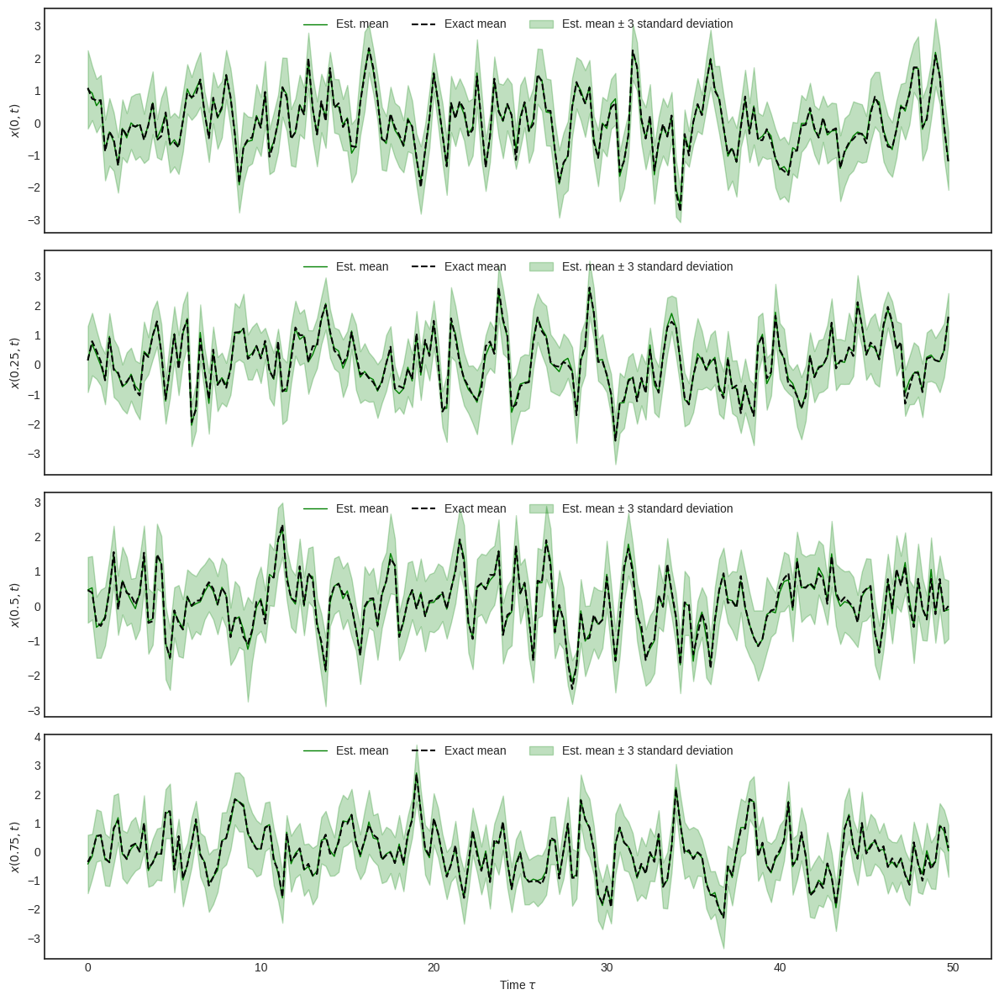

In [36]:
fig, axes = plot_results(
    results_sletpf, range(0, model.dim_state, model.dim_state // 4), True,  
    times[observation_time_indices], model.mesh_node_coords[:, 0],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean')

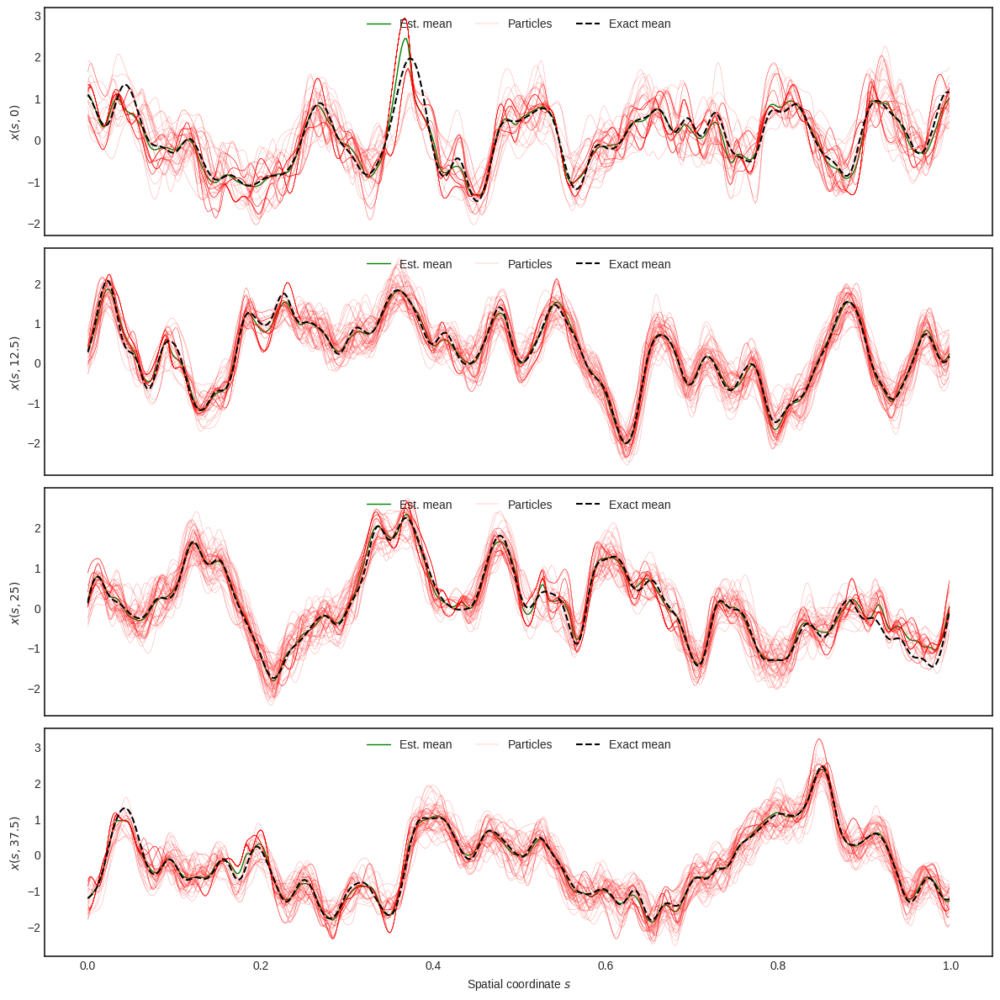

In [37]:
fig, axes = plot_results(
    results_sletpf, range(0, len(observation_time_indices), 50), False,
    model.mesh_node_coords[:, 0], times[observation_time_indices],
    results_kf['state_mean_sequence'][observation_time_indices], truth_label='Exact mean', 
    plot_particles=True, plot_region=False)